In [2]:
import pandas as pd
import plotly.express as px

In [3]:
ev = pd.read_csv('https://raw.githubusercontent.com/Frans-Grau/ElectricVehicleVsChargingStations/main/Datasets/WA-Final.csv')
cs = pd.read_csv('https://raw.githubusercontent.com/Frans-Grau/ElectricVehicleVsChargingStations/main/Datasets/Cstations2.csv')

C:\Users\frans\AppData\Local\Temp\ipykernel_7084\1654755984.py:2: DtypeWarning: Columns (3,6,10,13,14,15,16,20,29,31,33,34,35,36,43,45,46,47,49,52,53,54,56,57,58,59,60,61,62,63) have mixed types. Specify dtype option on import or set low_memory=False.
  cs = pd.read_csv('https://raw.githubusercontent.com/Frans-Grau/ElectricVehicleVsChargingStations/main/Datasets/Cstations2.csv')


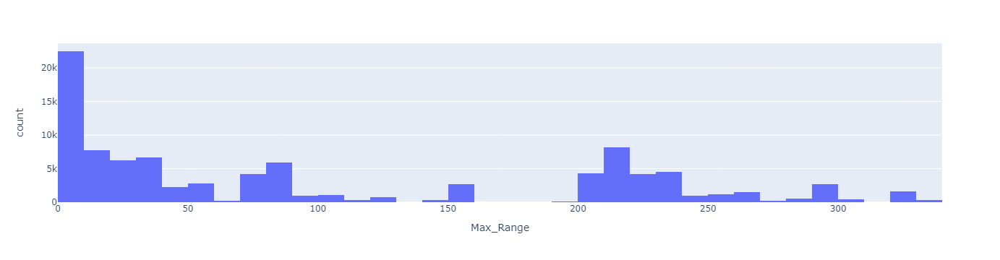

In [13]:
df = ev[ev['Max_Range']>1]
fig = px.histogram(df, x="Max_Range", nbins=50)
fig.show()

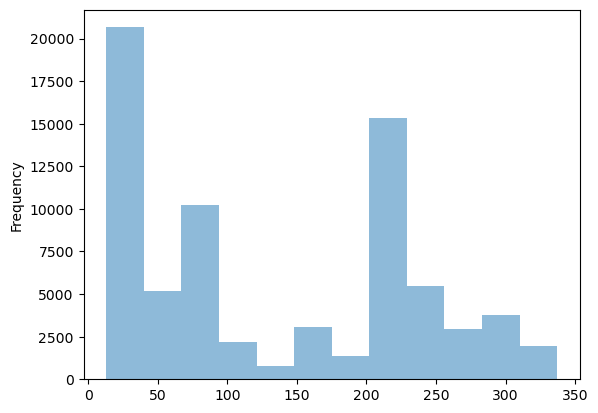

In [19]:
df=ev[ev['Max_Range']>10]
ax = df['Max_Range'].plot.hist(bins=12, alpha=0.5)

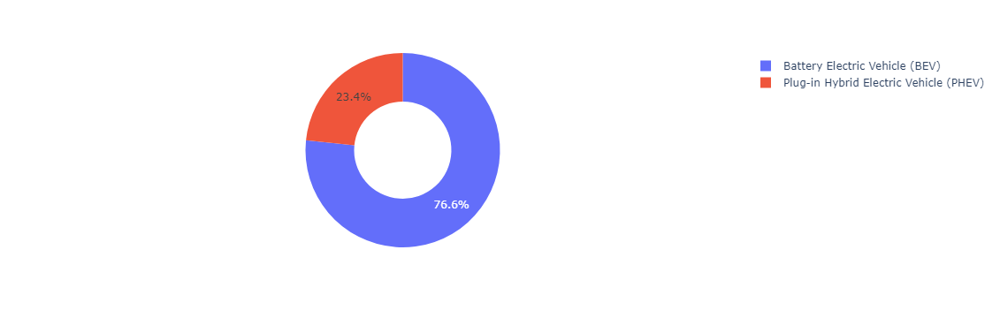

In [22]:
df1 = ev['Electric Vehicle Type'].value_counts()
px.pie(ev, values=df1.values, names=df1.index,hole=.5)

In [26]:
ev['Vehicle Location'].value_counts()

POINT (-122.13158 47.67858)    2979
POINT (-122.2066 47.67887)     2083
POINT (-122.1872 47.61001)     1996
POINT (-122.31765 47.70013)    1900
POINT (-122.21061 47.83448)    1894
                               ... 
POINT (-123.29831 46.57001)       1
POINT (-123.6386 46.33397)        1
POINT (-121.59274 48.48758)       1
POINT (-118.20299 48.11777)       1
POINT (-119.10557 47.69015)       1
Name: Vehicle Location, Length: 517, dtype: int64

<AxesSubplot:xlabel='longitude', ylabel='latitude'>

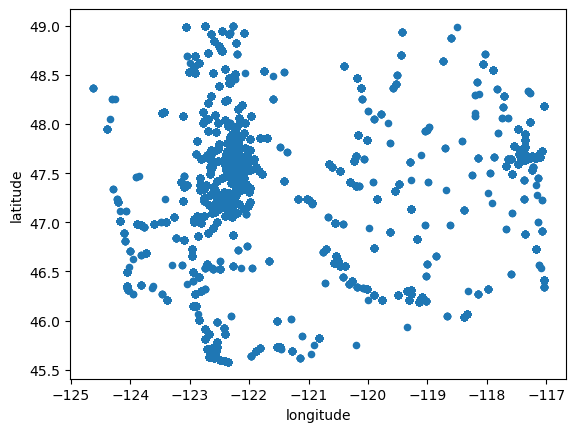

In [27]:
# Split the coordinates column into longitude and latitude
ev[['longitude', 'latitude']] = ev['Vehicle Location'].str.extract(r'POINT \((-?\d+\.\d+) (-?\d+\.\d+)\)')

# Convert longitude and latitude to numeric
ev[['longitude', 'latitude']] = ev[['longitude', 'latitude']].astype(float)

# Plot the longitude and latitude
ev.plot.scatter(x='longitude', y='latitude', s=None, c=None)

In [5]:
ev.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114042 entries, 0 to 114041
Data columns (total 20 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   Unnamed: 0                                         114042 non-null  int64  
 1   County                                             114042 non-null  object 
 2   City                                               114042 non-null  object 
 3   State                                              114042 non-null  object 
 4   Make                                               114042 non-null  object 
 5   Model                                              114042 non-null  object 
 6   Postal Code                                        114042 non-null  int64  
 7   Model Year                                         114042 non-null  int64  
 8   Electric Vehicle Type                              114042 non-null  object

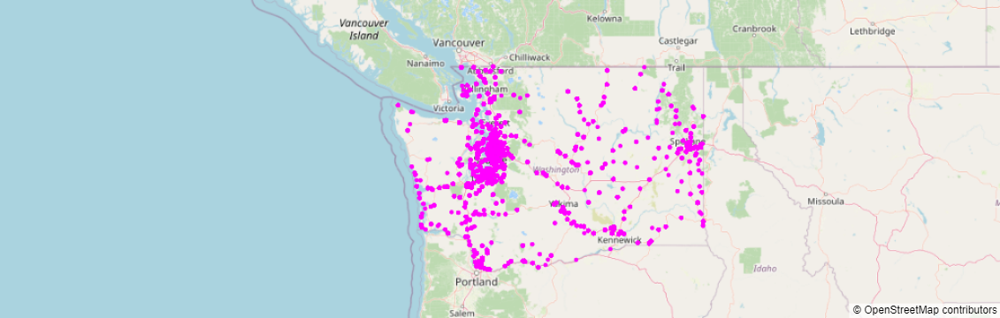

In [57]:
fig = px.scatter_mapbox(ev, lat="latitude", lon="longitude", hover_name="City",
                        color_discrete_sequence=["fuchsia"], zoom=5, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

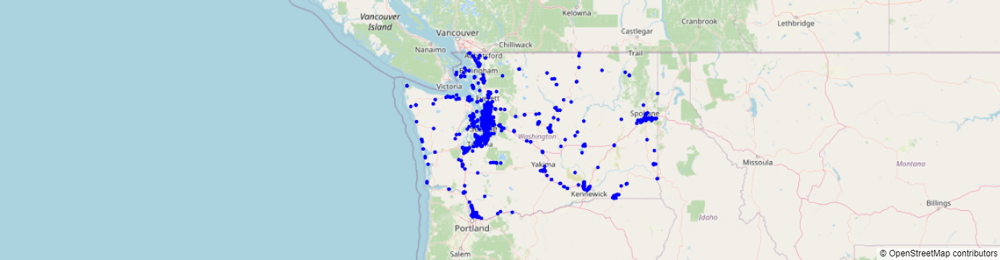

In [55]:
cs1 = cs[cs['State']=='WA']
fig = px.scatter_mapbox(cs1, lat="Latitude", lon="Longitude", hover_name="City",
                        color_discrete_sequence=["blue"], zoom=5, height=300)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [5]:
cs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56800 entries, 0 to 56799
Data columns (total 65 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Fuel Type Code                    56800 non-null  object 
 1   Station Name                      56800 non-null  object 
 2   Street Address                    56798 non-null  object 
 3   Intersection Directions           4827 non-null   object 
 4   City                              56800 non-null  object 
 5   State                             56800 non-null  object 
 6   ZIP                               56800 non-null  object 
 7   Plus4                             0 non-null      float64
 8   Station Phone                     52437 non-null  object 
 9   Status Code                       56800 non-null  object 
 10  Expected Date                     376 non-null    object 
 11  Groups With Access Code           56800 non-null  object 
 12  Acce

In [13]:
cs['Plus4'].value_counts()

Series([], Name: Plus4, dtype: int64)

In [20]:
cs['Facility Type'].value_counts()

CONVENIENCE_STORE            4614
HOTEL                        2504
CAR_DEALER                   2379
GAS_STATION                  1752
MUNI_GOV                     1032
OFFICE_BLDG                   935
FED_GOV                       906
RENTAL_CAR_RETURN             900
SHOPPING_CENTER               787
UTILITY                       768
STANDALONE_STATION            666
COLLEGE_CAMPUS                505
FLEET_GARAGE                  502
SHOPPING_MALL                 437
PAY_GARAGE                    415
INN                           355
PARKING_LOT                   329
PARKING_GARAGE                312
STATE_GOV                     311
RESTAURANT                    289
SCHOOL                        260
TRAVEL_CENTER                 249
BREWERY_DISTILLERY_WINERY     248
COOP                          246
PARK                          217
HOSPITAL                      190
AIRPORT                       159
OTHER_ENTERTAINMENT           151
MIL_BASE                      137
REC_SPORTS_FAC

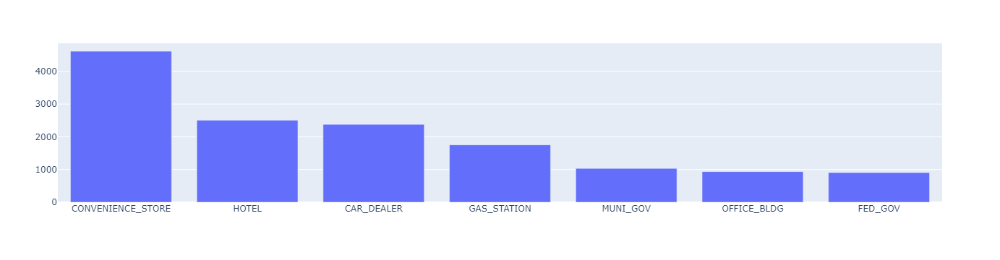

In [23]:
cs.loc[cs['Facility Type'] == 'FUEL_RESELLER', 'Facility Type'] = 'GAS_STATION'
cs.loc[cs['Facility Type'] == 'GROCERY', 'Facility Type'] = 'CONVENIENCE_STORE'
types = cs['Facility Type'].value_counts()
px.bar(types, y=types.values[:7], x=types.index[:7],labels=dict(x="", y=""))

In [24]:
cs['EV Network'].value_counts()

ChargePoint Network    25108
Non-Networked           8142
Tesla Destination       4436
SemaCharge Network      1824
Blink Network           1618
Tesla                   1074
Greenlots                975
EV Connect               883
eVgo Network             850
Volta                    779
Electrify America        670
FLO                      206
OpConnect                137
FCN                      116
POWERFLEX                 71
Webasto                   61
LIVINGSTON                47
AMPUP                     45
EVGATEWAY                 20
EVCS                       7
CHARGELAB                  4
ZEFNET                     4
FPLEV                      2
Electrify Canada           1
Name: EV Network, dtype: int64

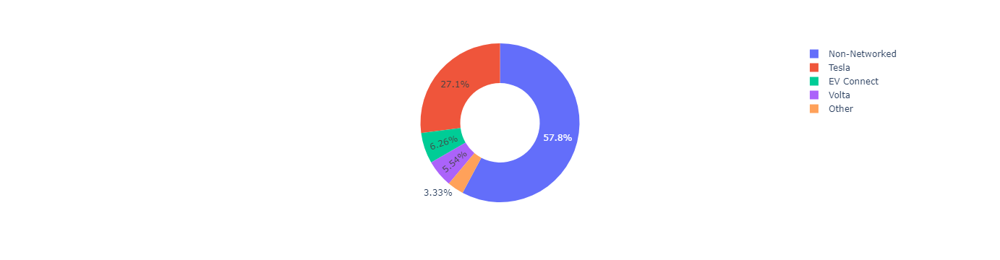

In [36]:
cs.loc[cs['EV Network'] == 'Tesla Destination', 'EV Network'] = 'Tesla'
cs.loc[cs['EV Network'] == 'ChargePoint Network', 'EV Network'] = 'ChargePoint'
cscounts = cs.groupby("EV Network")['Facility Type'].count().reset_index().sort_values('Facility Type',ascending=False)
top_5 = cscounts[:4]
other = cscounts[4:].sum().to_frame().T
other["EV Network"] = "Other"
cscounts = pd.concat([top_5,other], ignore_index=True)
fig1 = px.pie(cscounts, values="Facility Type", names="EV Network",hole=.5)
fig1.show()

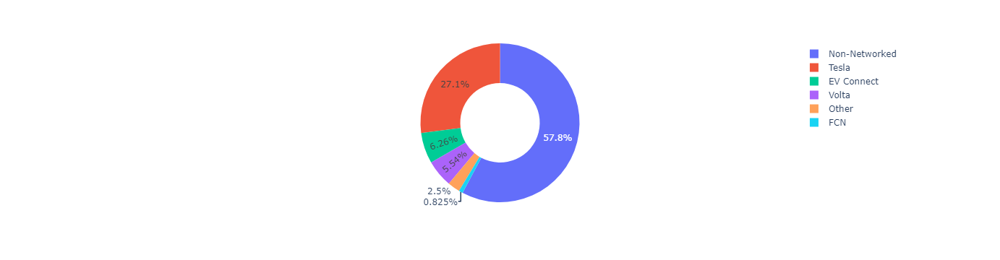

In [33]:

cscounts = cs.groupby("EV Network")['Facility Type'].count().reset_index().sort_values('Facility Type',ascending=False)

top_5 = cscounts[:5]
other = cscounts[5:].sum().to_frame().T
other["EV Network"] = "Other"
cscounts = pd.concat([top_5, other], ignore_index=True)

fig1 = px.pie(cscounts, values="Facility Type", names="EV Network",hole=.5)
fig1.show()

In [4]:
cs.State.value_counts()

CA    14936
TX     3006
NY     2971
FL     2826
MA     1952
WA     1843
GA     1764
CO     1670
IL     1455
PA     1416
NC     1376
MD     1291
MN     1235
MO     1222
VA     1207
OH     1198
MI     1151
OR     1053
AZ     1019
UT      939
TN      867
WI      845
NJ      766
IN      678
IA      640
KS      612
OK      611
CT      562
SC      519
NV      491
HI      407
AL      403
VT      318
NE      291
DC      291
KY      284
ME      282
AR      278
NM      260
LA      259
RI      240
MS      199
ID      177
NH      176
WV      159
SD      153
DE      127
ND      124
WY      103
MT       99
AK       44
PR        5
Name: State, dtype: int64